In [2]:
import librosa
import rootutils
import pathlib
import numpy as np
import matplotlib.pyplot as plt

rootutils.setup_root(".", indicator=".project-root", pythonpath=True)
root = pathlib.Path(rootutils.find_root("."))

from src.core.transforms.log_mel_spectrogram import LogMelSpectrogram

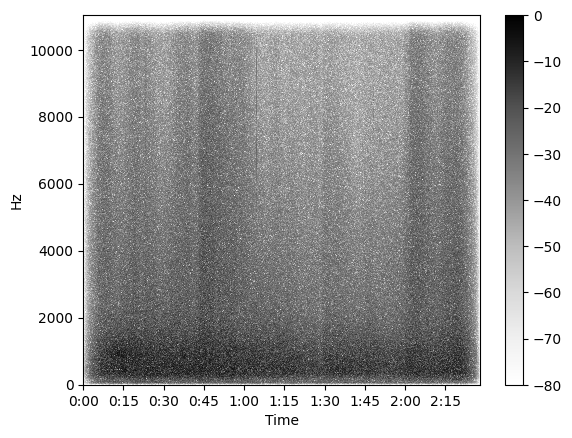

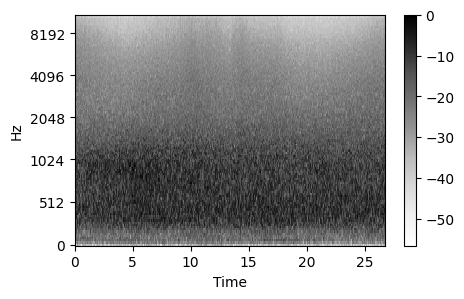

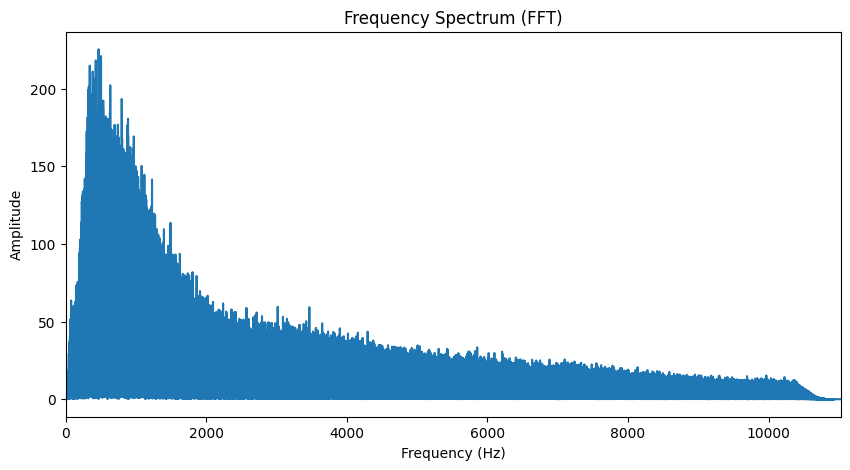

In [3]:
file_name = "soundsforyou-wind-in-trees-117477.mp3"
y, sr = librosa.load(root / "assets" / "audio" / file_name)

S = librosa.stft(y)
S_db = librosa.amplitude_to_db(np.abs(S), ref=np.max)
plt.figure()
librosa.display.specshow(S_db, x_axis='time', y_axis='linear', cmap="Greys")
plt.colorbar()
plt.show()

plt.figure(figsize=(5, 3))
M = librosa.feature.melspectrogram(y=y, sr=sr)
M_db = librosa.power_to_db(M[:, 384:384*4], ref=np.max)
librosa.display.specshow(M_db, y_axis='mel', x_axis='time', cmap="Greys")
plt.colorbar()
plt.show()

fft = np.fft.rfft(y)
magnitude = np.abs(fft)
freqs = np.fft.rfftfreq(len(y), d=1/sr)
plt.figure(figsize=(10, 5))
plt.plot(freqs, magnitude)
plt.xlabel("Frequency (Hz)")
plt.ylabel("Amplitude")
plt.title("Frequency Spectrum (FFT)")
plt.xlim(0, sr / 2)
plt.show()

In [15]:
M_db.shape

(128, 1152)

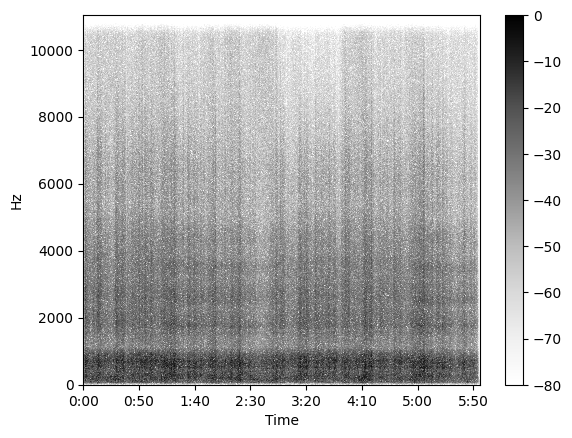

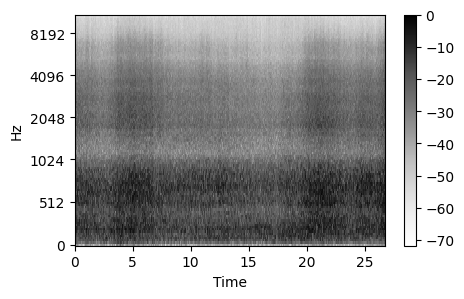

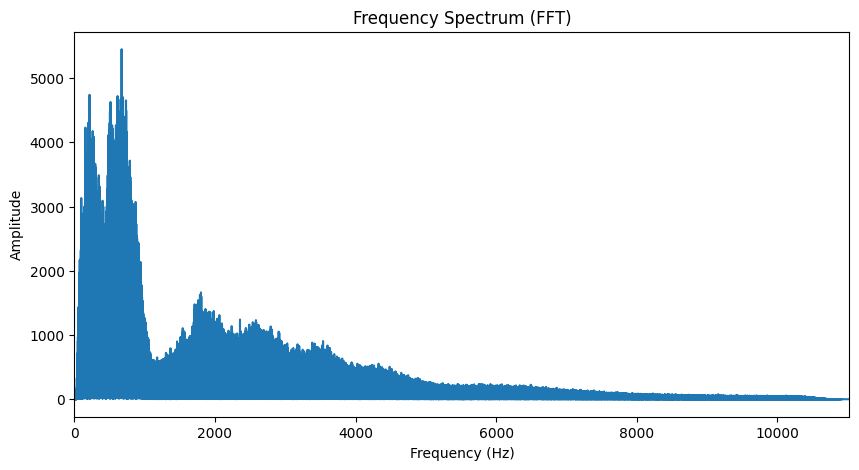

In [16]:
file_name = "Wind in trees..07005205.wav"
y, sr = librosa.load(root / "assets" / "audio" / file_name)

S = librosa.stft(y)
S_db = librosa.amplitude_to_db(np.abs(S), ref=np.max)
plt.figure()
librosa.display.specshow(S_db, x_axis='time', y_axis='linear', cmap="Greys")
plt.colorbar()
plt.show()

plt.figure(figsize=(5, 3))
M = librosa.feature.melspectrogram(y=y, sr=sr)
M_db = librosa.power_to_db(M[:, 384:384*4], ref=np.max)
librosa.display.specshow(M_db, y_axis='mel', x_axis='time', cmap="Greys")
plt.colorbar()
plt.show()

fft = np.fft.rfft(y)
magnitude = np.abs(fft)
# Frequency axis
freqs = np.fft.rfftfreq(len(y), d=1/sr)
# Plot
plt.figure(figsize=(10, 5))
plt.plot(freqs, magnitude)
plt.xlabel("Frequency (Hz)")
plt.ylabel("Amplitude")
plt.title("Frequency Spectrum (FFT)")
plt.xlim(0, sr / 2)
plt.show()

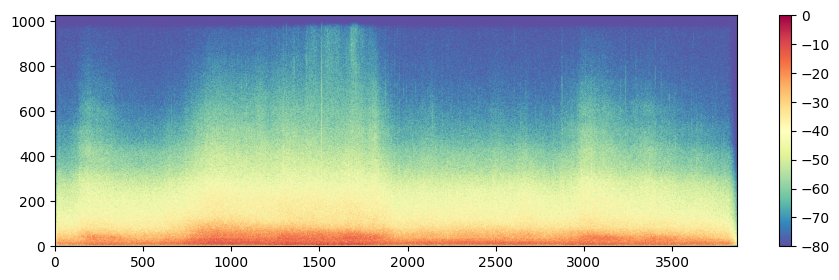

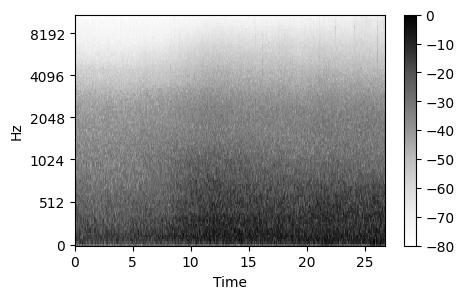

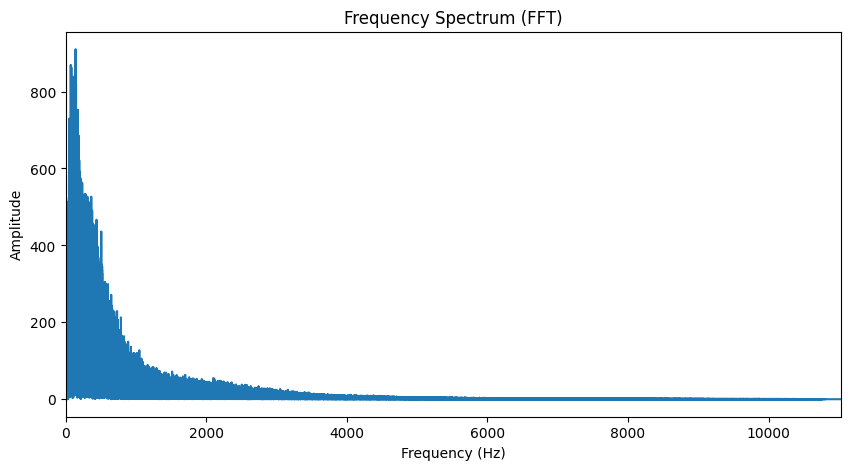

In [17]:
file_name = "windstorm-blowing-in-mountain-forest-ivo-vicic-1-01-29.mp3"
y, sr = librosa.load(root / "assets" / "audio" / file_name)

S = librosa.stft(y)
S_db = librosa.amplitude_to_db(np.abs(S), ref=np.max)
fig = plt.figure(figsize=(11, 3))
im = plt.gca().imshow(S_db, cmap="Spectral_r", aspect="auto", origin="lower")
fig.colorbar(im)
plt.show()

plt.figure(figsize=(5, 3))
M = librosa.feature.melspectrogram(y=y, sr=sr)
M_db = librosa.power_to_db(M[:, 384:384*4], ref=np.max)
librosa.display.specshow(M_db, y_axis='mel', x_axis='time', cmap="Greys")
plt.colorbar()
plt.show()

fft = np.fft.rfft(y)
magnitude = np.abs(fft)
# Frequency axis
freqs = np.fft.rfftfreq(len(y), d=1/sr)
# Plot
plt.figure(figsize=(10, 5))
plt.plot(freqs, magnitude)
plt.xlabel("Frequency (Hz)")
plt.ylabel("Amplitude")
plt.title("Frequency Spectrum (FFT)")
plt.xlim(0, sr / 2)
plt.show()

In [18]:
from src.core.data.sounding_out_chorus import SoundingOutChorus

data = SoundingOutChorus(root="/its/home/kag25/data/sounding_out", scope="EC")

/its/home/kag25/projects/ecolistening/interpretable_bioacoustic_classifiers/.venv/lib/python3.10/site-packages/lightning/fabric/__init__.py:41: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.


In [19]:
spectrogram = LogMelSpectrogram(sample_rate=48000, fft_window_length=512, num_fft=512, fft_hop_length=384, num_mel_bins=64, mel_max_hertz=15000)

torch.Size([64, 7500])


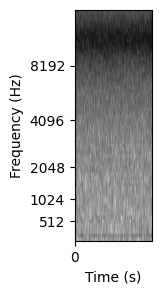

In [79]:
plt.figure(figsize=(1, 3))
x = spectrogram(data[2][0].unsqueeze(0)).squeeze()
print(x.shape)
spectrogram.plot(x[:, :192], cmap="Greys")
plt.show()

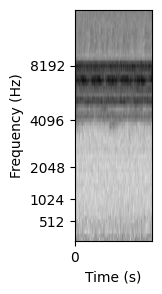

In [78]:
i = 12
plt.figure(figsize=(1, 3))
x = spectrogram(data[i][0].unsqueeze(0)).squeeze()
spectrogram.plot(x[:, :192], cmap="Greys")
plt.show()

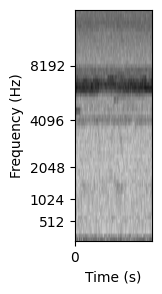

In [105]:
i = 255
plt.figure(figsize=(1, 3))
x = spectrogram(data[i][0].unsqueeze(0)).squeeze()
spectrogram.plot(x[:, :192], cmap="Greys")
plt.show()

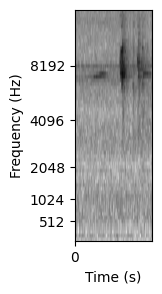

In [118]:
i = 200
plt.figure(figsize=(1, 3))
x = spectrogram(data[i][0].unsqueeze(0)).squeeze()
spectrogram.plot(x[:, :192], cmap="Greys")
plt.show()

In [119]:
from src.core.data.sounding_out_chorus import SoundingOutChorus

data = SoundingOutChorus(root="/its/home/kag25/data/sounding_out", scope="UK")

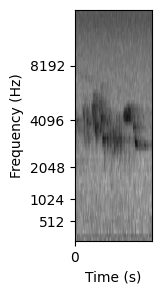

In [129]:
i = 200
plt.figure(figsize=(1, 3))
x = spectrogram(data[i][0].unsqueeze(0)).squeeze()
t = 15
spectrogram.plot(x[:, t*192:(t+1)*192], cmap="Greys")
plt.show()

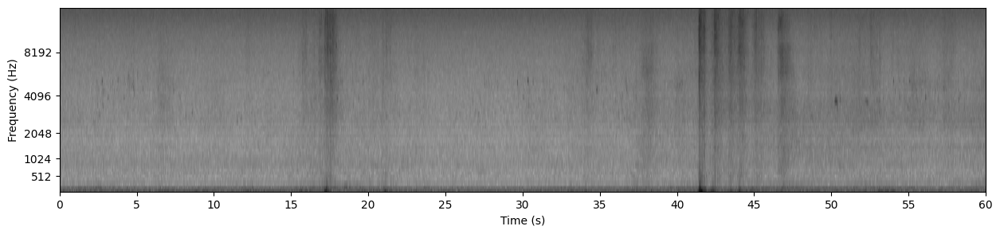

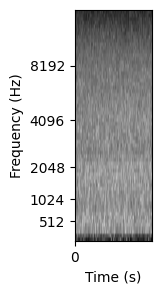

In [143]:
i = 7
plt.figure(figsize=(15, 3))
x = spectrogram(data[i][0].unsqueeze(0)).squeeze()
t = 0
spectrogram.plot(x[:, :], cmap="Greys")
plt.show()
plt.figure(figsize=(1, 3))
spectrogram.plot(x[:, t*192:(t+1)*192], cmap="Greys")
plt.show()

In [38]:
data = SoundingOutChorus(root="/its/home/kag25/data/sounding_out")
data.metadata[data.metadata.file_name == "BA-12_0_20150620_1645.wav"]

,file_name,country,name,location,recorder,channel,dawn_dusk,time_period,habitat,site,...,longitude,altitude,species_richness,species_abundance,recorder_no,recorder_model,datetime,hour,stage,file_path
file_i,,,,,,,,,,,,,,,,,,,,,
399,BA-12_0_20150620_1645.wav,UK,Balmer Farm,BA,BA12,0,dusk,day,UK3,UK3-12,...,-0.072346,159.48,1,1,12,SM3,2015-06-20 16:45:00+01:00,16,train,/its/home/kag25/data/sounding_out/train/data/B...


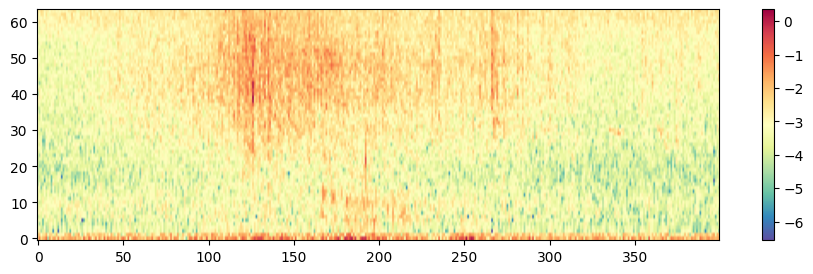

In [52]:
x = spectrogram(data.load_sample("/its/home/kag25/data/sounding_out/train/data/BA-12_0_20150620_1645.wav")).squeeze()
fig = plt.figure(figsize=(11, 3))
im = plt.gca().imshow(x[:, 6400:6800], cmap="Spectral_r", aspect="auto", origin="lower")
fig.colorbar(im)
plt.show()


In [48]:
import IPython

IPython.display.Audio("/its/home/kag25/data/sounding_out/train/data/BA-12_0_20150620_1645.wav")

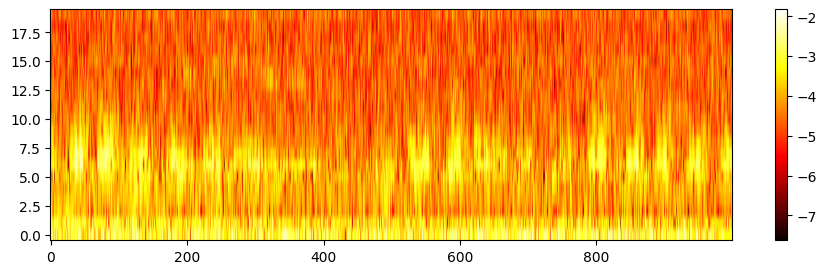

In [65]:

file_name = "PO-06_0_20150821_0640.wav"
x = spectrogram(data.load_sample(f"/its/home/kag25/data/sounding_out/train/data/{file_name}")).squeeze()
fig = plt.figure(figsize=(11, 3))
im = plt.gca().imshow(x[0:20, :1000], cmap="hot", aspect="auto", origin="lower")
fig.colorbar(im)
plt.show()
